In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import os
import seaborn as sns
import umap
import warnings
from collections import OrderedDict
from scipy import signal, stats
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d

plt.rcParams.update({'figure.max_open_warning': 0})
warnings.simplefilter("ignore")

%run /media/turritopsis/katie/grooming/t1-grooming/grooming_functions.ipynb
%matplotlib inline

# for figure styling
sns.set()
sns.set_style('ticks')

In [2]:
titles = {
    'A_flex': 'coxa flexion',
    'A_abduct': 'body-coxa abduction',
    'A_rot': 'coxa rotation',
    'B_flex': 'coxa-femur flexion',
    'B_rot': 'femur rotation',
    'C_flex': 'femur-tibia flexion',
    'C_rot': 'tibia rotation',
    'D_flex': 'tibia-tarsus flexion',
    '_BC': 'body-coxa abduction'
}

In [3]:
behavior = 't1_grooming'
prefix = '/media/turritopsis/katie/grooming/summaries/v3-b2'
data_path = os.path.join(prefix, 't1_grooming_subset_curated.parquet')
# data_path = os.path.join(prefix, 'subset_t1_grooming.parquet')
# data_path = os.path.join(prefix, 'lines-' + behavior + '_onball_processed.parquet')
data = pd.read_parquet(data_path, engine='fastparquet')

fps = 300.0 # know this for this dataset
bout_numbers = np.unique(np.array(data.behavior_bout))
angle_vars = np.unique([v for v in data.columns
              if some_contains(v, ['_BC', '_flex', '_rot', '_abduct'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])])

In [4]:
# add velocity and acceleration columns to data
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])]

dt = 1/fps
s = 1.0/dt
s2 = 1.0 / (dt * dt)

for j in range(len(bout_numbers)):
    mask = data.behavior_bout == bout_numbers[j]
    bout_df = data.loc[mask]
    for ang in angle_vars:
        bout = np.array(bout_df[ang])
        data.loc[mask, ang + '_d1'] = signal.savgol_filter(bout, 5, 3, deriv=1) * s
        data.loc[mask, ang + '_d2'] = signal.savgol_filter(bout, 5, 3, deriv=2) * s2

KeyboardInterrupt: 

In [ ]:
# plot angle distributions for individual flies 

lines = np.unique(data['line'])
colors = sns.color_palette('colorblind', len(lines))
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])]
angle_names_u = np.unique([x[2:] for x in angle_vars])
legs = ['L1', 'L2', 'L3', 'R1', 'R2', 'R3']
legs = ['L1', 'R1']

for i in range(len(angle_names_u)): 
    
    fig, axs = plt.subplots(int(len(legs)/2), 2, sharex = True, figsize = (15,3*int(len(legs)/2)))
    # fig.suptitle('distribution of ' + titles[angle_names_u[i]] + ' angles during t1 grooming', y = 0.97)
    ax = axs.T.flatten()
    
    for j in range(len(legs)):
        
        ax[j].set_ylabel('PDF')
        ax[j].set_xlabel(legs[j] + ' ' + titles[angle_names_u[i]] + ' (deg)')
        
        for k in range(len(lines)):
            
            fly_data = data[data['line'] == lines[k]]
            t1 = fly_data.iloc[0:][legs[j] + angle_names_u[i]]
            t1 = t1[np.isfinite(t1)] # ignores nans 
            if len(t1) <= 1: 
                continue        

            kernel_t1 = stats.gaussian_kde(t1)    
            t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
            height_t1 = kernel_t1.pdf(t1)                                                     
            ax[j].plot(t1, height_t1, label = lines[k], color = colors[k])
            ax[j].tick_params(labelbottom = True)
            
        # plot average distribution for all flies
        t1 = data.iloc[0:][legs[j] + angle_names_u[i]]
        t1 = t1[np.isfinite(t1)] # ignores nans   
        kernel_t1 = stats.gaussian_kde(t1)    
        t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
        height_t1 = kernel_t1.pdf(t1)                                                     
        ax[j].plot(t1, height_t1, label = 'all flies', color = 'k')
    
    hs, ls = ax[j].get_legend_handles_labels() 
    plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
    plt.show()
    
fig = plt.figure(figsize = (3,3))
plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12, ncol = 3)
plt.axis('off')
plt.tight_layout()
plt.show()    

KeyboardInterrupt: 

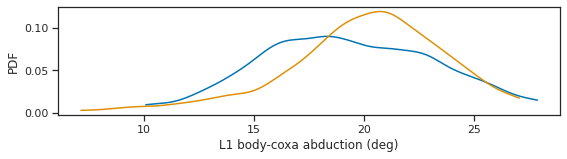

In [49]:
# plot angle distributions for individual flies with the most data

sns.set_style('ticks')
lines = np.unique(data['line'])
colors = sns.color_palette('colorblind', len(lines))
legs = ['L1', 'R1']
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])
              and v[:2] in legs]

for i in range(len(angle_vars)): 
    
    fig, ax = plt.subplots(1, 1, sharex = True, figsize = (9,2))   
    ax.set_ylabel('PDF')
    ax.set_xlabel(angle_vars[i][:2] + ' ' + titles[angle_vars[i][2:]] + ' (deg)')

    for k in range(len(lines)):

        fly_data = data[data['line'] == lines[k]]
        t1 = fly_data.iloc[0:][angle_vars[i]]
        t1 = t1[np.isfinite(t1)] # ignores nans 
        if len(t1) <= 1: 
            continue        

        kernel_t1 = stats.gaussian_kde(t1)    
        t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
        height_t1 = kernel_t1.pdf(t1)                                                     
        ax.plot(t1, height_t1, label = lines[k], color = colors[k])
        ax.tick_params(labelbottom = True)

    # plot average distribution for all flies
    t1 = data.iloc[0:][angle_vars[i]]
    t1 = t1[np.isfinite(t1)] # ignores nans   
    kernel_t1 = stats.gaussian_kde(t1)    
    t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
    height_t1 = kernel_t1.pdf(t1)                                                     
    ax.plot(t1, height_t1, label = 'all flies', color = 'k')

    hs, ls = ax.get_legend_handles_labels() 
    plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
    sns.despine()
    plt.show()
    
fig = plt.figure(figsize = (3,3))
plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12)
plt.axis('off')
plt.tight_layout()
plt.show()    

In [ ]:
fig = plt.figure(figsize = (3,3))
plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12, ncol = 2)
plt.axis('off')
plt.tight_layout()
plt.show()  

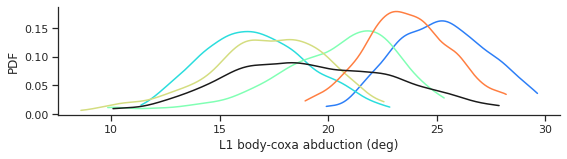

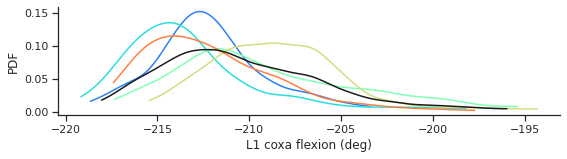

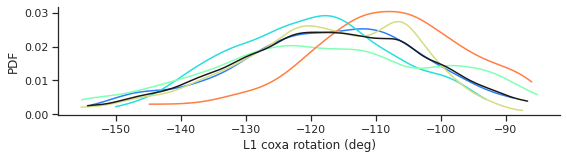

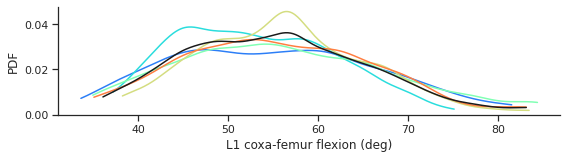

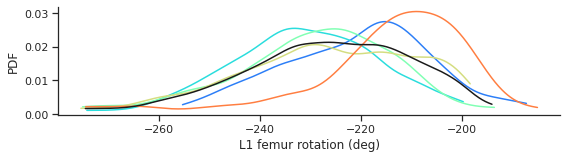

...

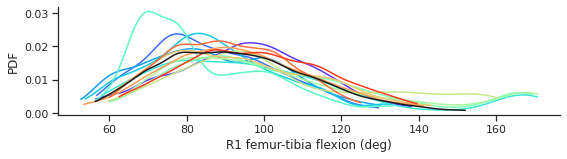

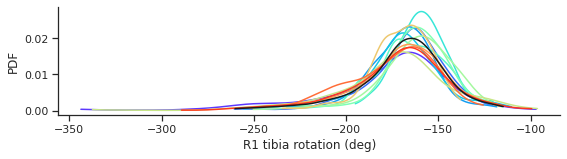

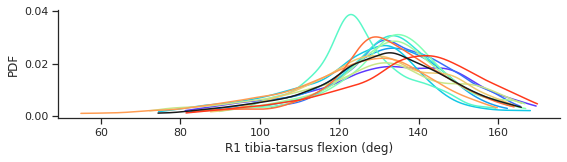

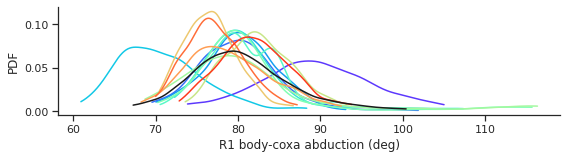

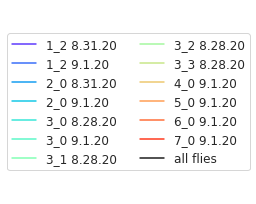

In [11]:
# plot angle distributions for individual flies with the most data
sns.set_style('ticks')
lines = np.unique(data['line'])
legs = ['L1', 'R1']
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])
              and v[:2] in legs]

for line in lines:
    
    d = data[data['line']==line]
    flyids = np.unique(d['flyid'])
    colors = sns.color_palette('rainbow', len(flyids))

    for i in range(len(angle_vars)): 

        fig, ax = plt.subplots(1, 1, sharex = True, figsize = (9, 2))
        # fig.suptitle('distribution of ' + titles[angle_names_u[i]] + ' angles during t1 grooming (' + line + ')', y = 0.97)
        ax.set_ylabel('PDF')
        ax.set_xlabel(angle_vars[i][:2] + ' ' + titles[angle_vars[i][2:]] + ' (deg)')

        for k in range(len(flyids)):

            fly_data = d[d['flyid'] == flyids[k]]
            t1 = fly_data.iloc[0:][angle_vars[i]]
            t1 = t1[np.isfinite(t1)] # ignores nans 
            if len(t1) <= 1: 
                continue        

            kernel_t1 = stats.gaussian_kde(t1)    
            t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
            height_t1 = kernel_t1.pdf(t1)                       
            ax.plot(t1, height_t1, label = flyids[k], color = colors[k])
            ax.tick_params(labelbottom = True)

        # plot average distribution for all flies
        t1 = d.iloc[0:][angle_vars[i]]
        t1 = t1[np.isfinite(t1)] # ignores nans   
        kernel_t1 = stats.gaussian_kde(t1)    
        t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
        height_t1 = kernel_t1.pdf(t1)                                                     
        ax.plot(t1, height_t1, label = 'all flies', color = 'k')

        hs, ls = ax.get_legend_handles_labels()
        plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
        sns.despine()
        plt.show()
        
    fig = plt.figure(figsize = (3,3))
    plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12, ncol = 2)
    plt.axis('off')
    plt.tight_layout()
    plt.show()   

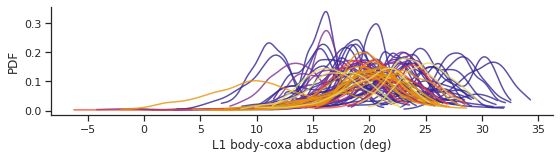

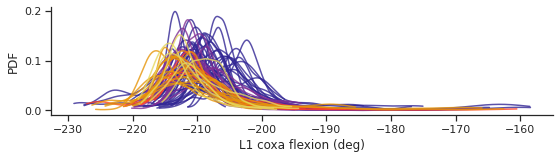

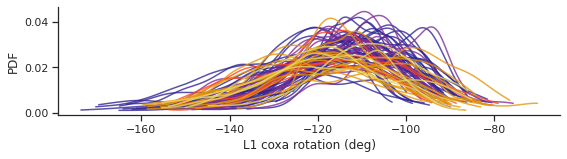

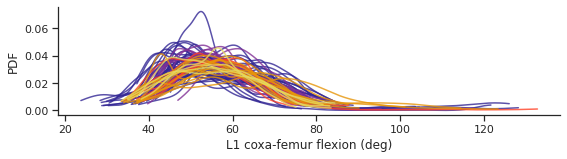

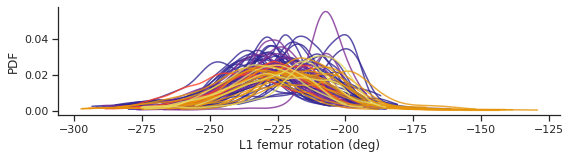

...

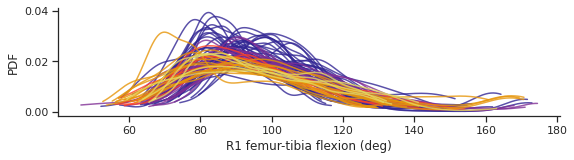

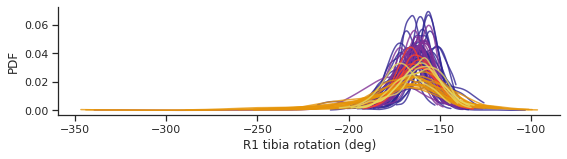

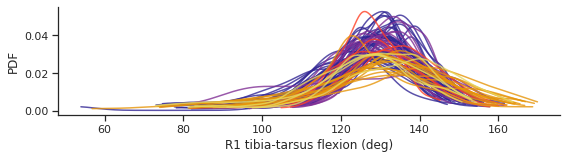

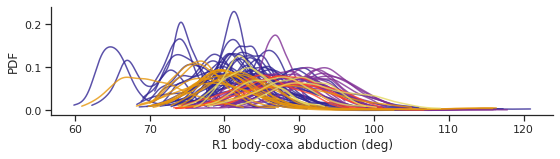

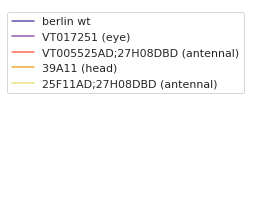

In [19]:
# plot angle distributions for individual flies with the most data
sns.set_style('ticks')
lines = np.unique(data['line'])
lines = np.flip(lines)
legs = ['L1', 'R1']
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])
              and v[:2] in legs]
colors = sns.color_palette('CMRmap', len(lines))
# colors = ['k', 'r', 'g', 'y', 'b']

for i in range(len(angle_vars)):

    fig, ax = plt.subplots(1, 1, sharex = True, figsize = (9, 2))
    # fig.suptitle('distribution of ' + titles[angle_names_u[i]] + ' angles during t1 grooming (' + line + ')', y = 0.97)
    ax.set_ylabel('PDF')
    ax.set_xlabel(angle_vars[i][:2] + ' ' + titles[angle_vars[i][2:]] + ' (deg)')

    for n, line in enumerate(lines):

        d = data[data['line']==line]
        flyids = np.unique(d['flyid'])
        c = colors[n]

        for k in range(len(flyids)):

            fly_data = d[d['flyid'] == flyids[k]]
            t1 = fly_data.iloc[0:][angle_vars[i]]
            t1 = t1[np.isfinite(t1)] # ignores nans 
            if len(t1) <= 1: 
                continue        

            kernel_t1 = stats.gaussian_kde(t1)    
            t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
            height_t1 = kernel_t1.pdf(t1)                       
            ax.plot(t1, height_t1, label = line, color = c, alpha = 0.8)
            ax.tick_params(labelbottom = True)

#         # plot average distribution for all flies
#         t1 = d.iloc[0:][angle_vars[i]]
#         t1 = t1[np.isfinite(t1)] # ignores nans   
#         kernel_t1 = stats.gaussian_kde(t1)    
#         t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
#         height_t1 = kernel_t1.pdf(t1)                                                     
#         ax.plot(t1, height_t1, label = 'all flies', color = 'k')

    hs, ls = ax.get_legend_handles_labels()
    plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
    sns.despine()
    plt.show()
        
fig = plt.figure(figsize = (3,3))       
by_label = OrderedDict(zip(ls, hs))
plt.legend(by_label.values(), by_label.keys())
plt.axis('off')
plt.tight_layout()
plt.show()   

In [ ]:
# plot angle distributions for individual flies with the most data
sns.set_style('ticks')
lines = np.unique(data['line'])
legs = ['L1', 'R1']
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])
              and v[:2] in legs]

for line in lines:
    
    d = data[data['line']==line]
    flyids = np.unique(d['flyid'])
    colors = sns.color_palette('rainbow', len(flyids))

    for i in range(len(angle_vars)): 

        fig, ax = plt.subplots(1, 1, sharex = True, figsize = (9, 2))
        # fig.suptitle('distribution of ' + titles[angle_names_u[i]] + ' angles during t1 grooming (' + line + ')', y = 0.97)
        ax.set_ylabel('PDF')
        ax.set_xlabel(angle_vars[i][:2] + ' ' + titles[angle_vars[i][2:]] + ' (deg)')

        for k in range(len(flyids)):

            fly_data = d[d['flyid'] == flyids[k]]
            t1 = fly_data.iloc[0:][angle_vars[i]]
            t1 = t1[np.isfinite(t1)] # ignores nans 
            if len(t1) <= 1: 
                continue        

            kernel_t1 = stats.gaussian_kde(t1)    
            t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
            height_t1 = kernel_t1.pdf(t1)                       
            ax.plot(t1, height_t1, label = flyids[k], color = colors[k])
            ax.tick_params(labelbottom = True)

        # plot average distribution for all flies
        t1 = d.iloc[0:][angle_vars[i]]
        t1 = t1[np.isfinite(t1)] # ignores nans   
        kernel_t1 = stats.gaussian_kde(t1)    
        t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
        height_t1 = kernel_t1.pdf(t1)                                                     
        ax.plot(t1, height_t1, label = 'all flies', color = 'k')

        hs, ls = ax.get_legend_handles_labels()
        plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
        sns.despine()
        plt.show()
        
    fig = plt.figure(figsize = (3,3))
    plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12, ncol = 2)
    plt.axis('off')
    plt.tight_layout()
    plt.show()   

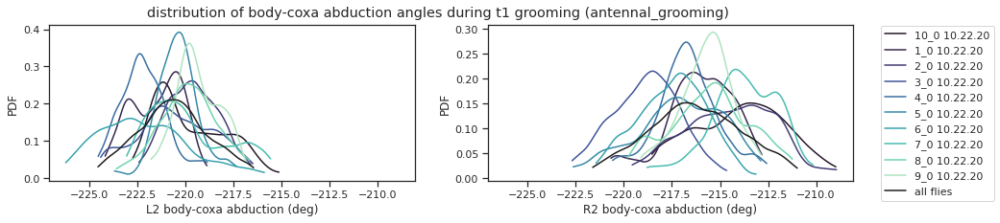

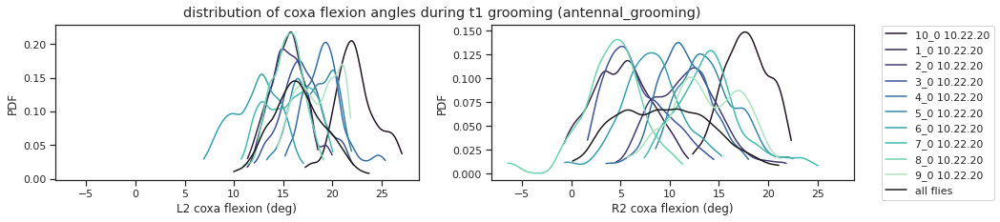

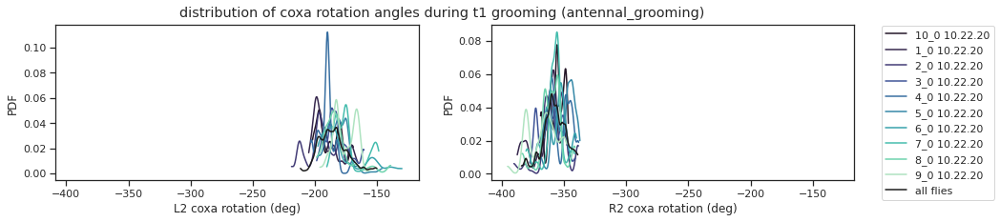

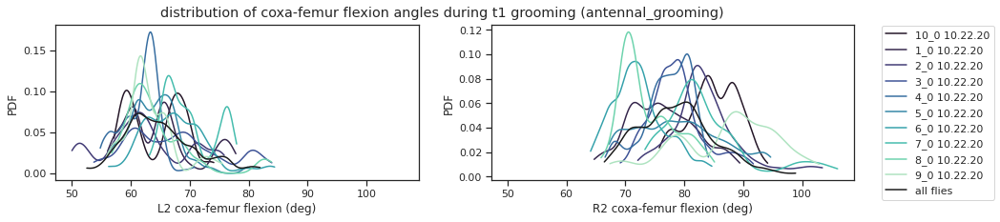

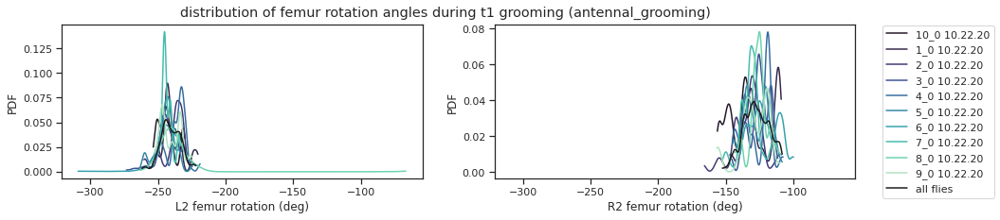

...

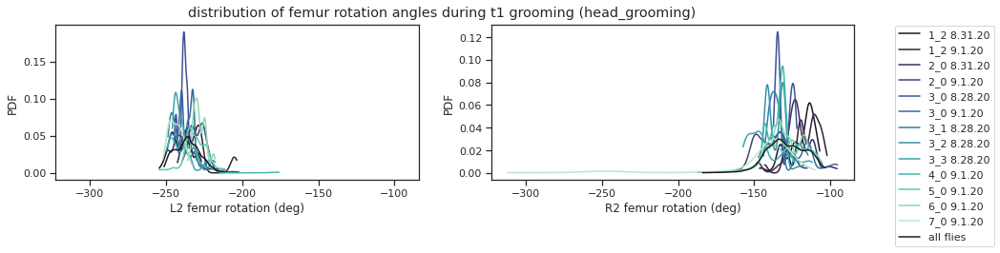

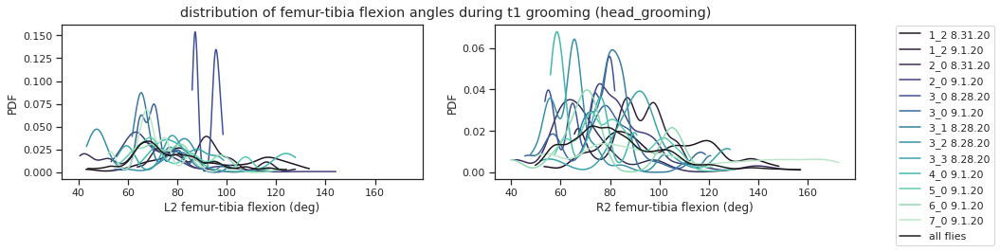

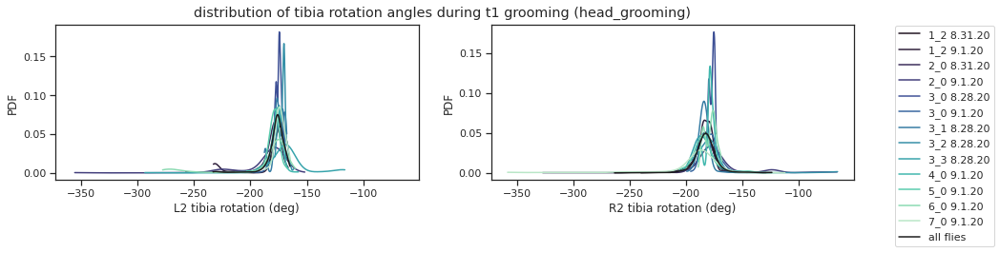

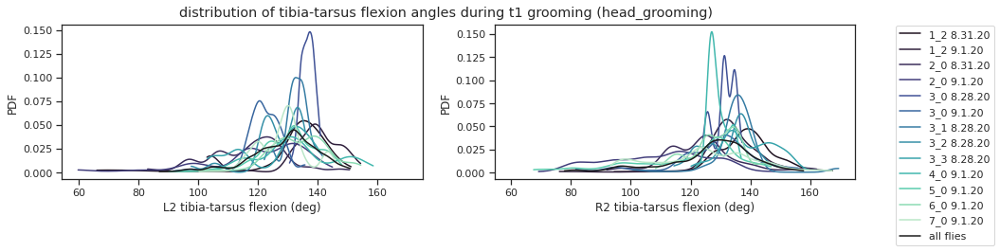

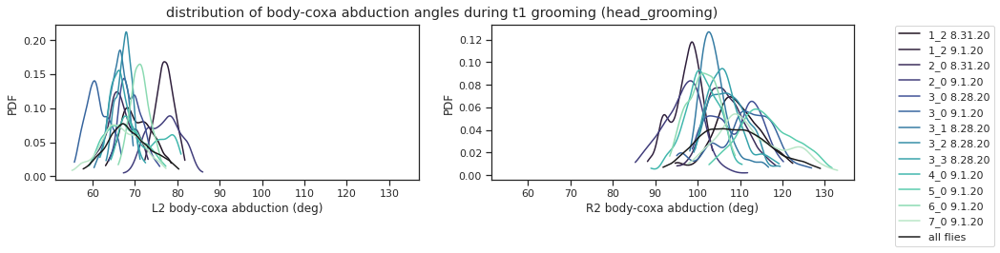

In [25]:
# plot angle distributions for individual flies with the most data
lines = np.unique(data['line'])
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])]
angle_names_u = np.unique([x[2:] for x in angle_vars])
legs = ['L1', 'L2', 'L3', 'R1', 'R2', 'R3']
legs = ['L1', 'R1']

for line in lines:
    
    d = data[data['line']==line]
    flyids = np.unique(d['flyid'])
    colors = sns.color_palette('mako', len(flyids))

    for i in range(len(angle_names_u)): 

        fig, axs = plt.subplots(int(len(legs)/2), 2, sharex = True, figsize = (15,3*int(len(legs)/2)))
        fig.suptitle('distribution of ' + titles[angle_names_u[i]] + ' angles during t1 grooming (' + line + ')', y = 0.97)
        ax = axs.T.flatten()

        for j in range(len(legs)):

            ax[j].set_ylabel('PDF')
            ax[j].set_xlabel(legs[j] + ' ' + titles[angle_names_u[i]] + ' (deg)')

            for k in range(len(flyids)):

                fly_data = d[d['flyid'] == flyids[k]]
                t1 = fly_data.iloc[0:][legs[j] + angle_names_u[i]]
                t1 = t1[np.isfinite(t1)] # ignores nans 
                if len(t1) <= 1: 
                    continue        

                kernel_t1 = stats.gaussian_kde(t1)    
                t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
                height_t1 = kernel_t1.pdf(t1)                       
                ax[j].plot(t1, height_t1, label = flyids[k], color = colors[k])
                ax[j].tick_params(labelbottom = True)

            # plot average distribution for all flies
            t1 = d.iloc[0:][legs[j] + angle_names_u[i]]
            t1 = t1[np.isfinite(t1)] # ignores nans   
            kernel_t1 = stats.gaussian_kde(t1)    
            t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
            height_t1 = kernel_t1.pdf(t1)                                                     
            ax[j].plot(t1, height_t1, label = 'all flies', color = 'k')

        plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
        plt.legend(bbox_to_anchor = (1.4, 1.03))
        plt.show()


###### velocity

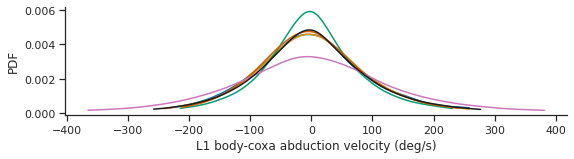

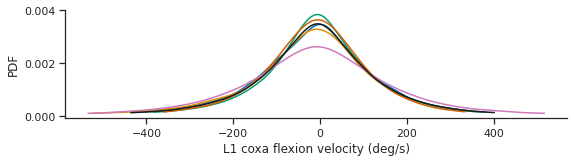

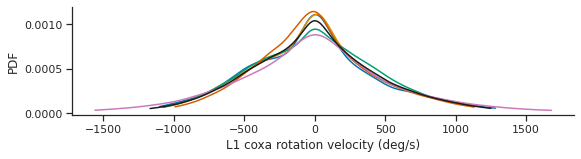

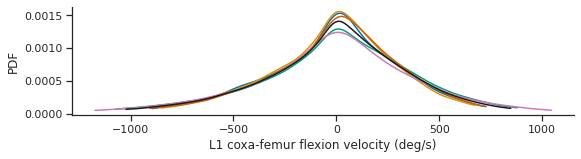

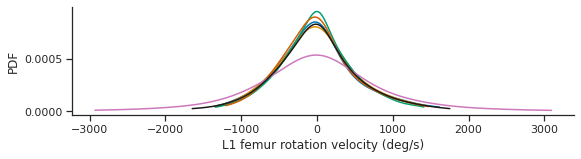

...

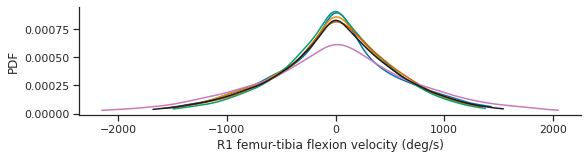

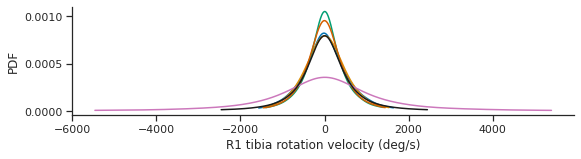

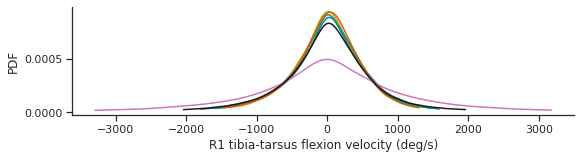

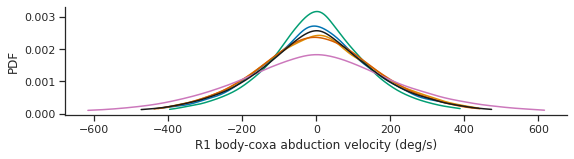

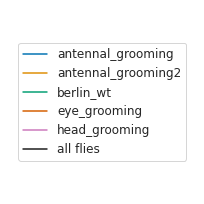

In [12]:
# plot angle distributions for individual flies with the most data

sns.set_style('ticks')
lines = np.unique(data['line'])
colors = sns.color_palette('colorblind', len(lines))
legs = ['L1', 'R1']
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and some_contains(v, ['_d1'])
              and not some_contains(v, ['_d2', '_freq', '_range', 'fictrac'])
              and v[:2] in legs]

for i in range(len(angle_vars)): 
    
    fig, ax = plt.subplots(1, 1, sharex = True, figsize = (9,2))   
    ax.set_ylabel('PDF')
    ax.set_xlabel(angle_vars[i][:2] + ' ' + titles[angle_vars[i][2:-3]] + ' velocity (deg/s)')

    for k in range(len(lines)):

        fly_data = data[data['line'] == lines[k]]
        t1 = fly_data.iloc[0:][angle_vars[i]]
        t1 = t1[np.isfinite(t1)] # ignores nans 
        if len(t1) <= 1: 
            continue        

        kernel_t1 = stats.gaussian_kde(t1)    
        t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
        height_t1 = kernel_t1.pdf(t1)                                                     
        ax.plot(t1, height_t1, label = lines[k], color = colors[k])
        ax.tick_params(labelbottom = True)

    # plot average distribution for all flies
    t1 = data.iloc[0:][angle_vars[i]]
    t1 = t1[np.isfinite(t1)] # ignores nans   
    kernel_t1 = stats.gaussian_kde(t1)    
    t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
    height_t1 = kernel_t1.pdf(t1)                                                     
    ax.plot(t1, height_t1, label = 'all flies', color = 'k')

    hs, ls = ax.get_legend_handles_labels() 
    plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
    sns.despine()
    plt.show()
    
fig = plt.figure(figsize = (3,3))
plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12)
plt.axis('off')
plt.tight_layout()
plt.show()    

###### acceleration

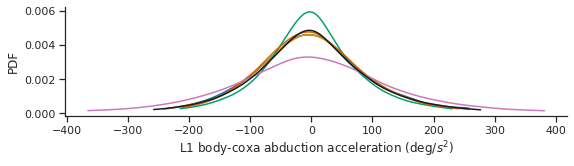

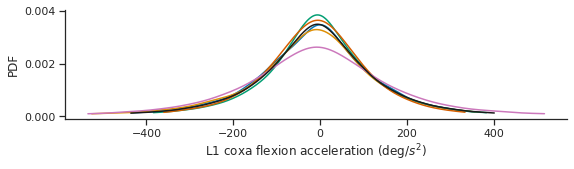

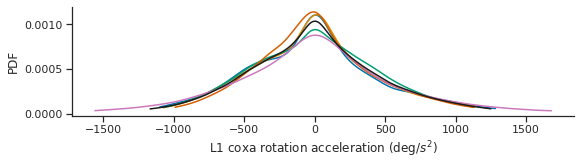

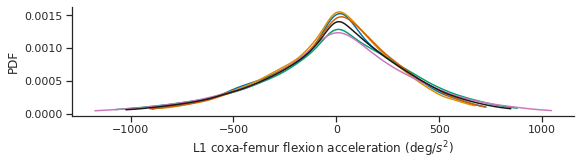

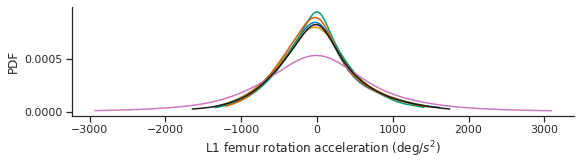

...

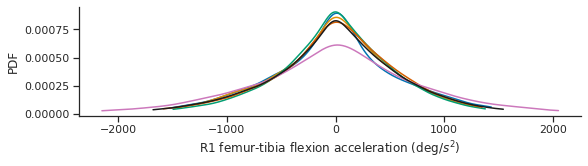

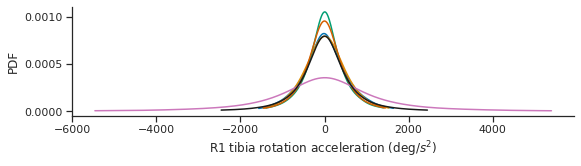

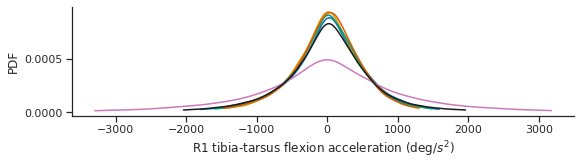

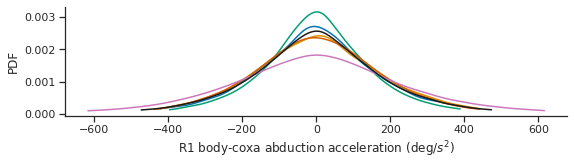

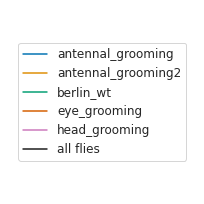

In [13]:
# plot angle distributions for individual flies with the most data

sns.set_style('ticks')
lines = np.unique(data['line'])
colors = sns.color_palette('colorblind', len(lines))
legs = ['L1', 'R1']
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_abduct', '_rot', '_BC'])
              and some_contains(v, ['_d1'])
              and not some_contains(v, ['_d2', '_freq', '_range', 'fictrac'])
              and v[:2] in legs]

for i in range(len(angle_vars)): 
    
    fig, ax = plt.subplots(1, 1, sharex = True, figsize = (9,2))   
    ax.set_ylabel('PDF')
    ax.set_xlabel(angle_vars[i][:2] + ' ' + titles[angle_vars[i][2:-3]] + ' acceleration (deg/$s^2$)')

    for k in range(len(lines)):

        fly_data = data[data['line'] == lines[k]]
        t1 = fly_data.iloc[0:][angle_vars[i]]
        t1 = t1[np.isfinite(t1)] # ignores nans 
        if len(t1) <= 1: 
            continue        

        kernel_t1 = stats.gaussian_kde(t1)    
        t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
        height_t1 = kernel_t1.pdf(t1)                                                     
        ax.plot(t1, height_t1, label = lines[k], color = colors[k])
        ax.tick_params(labelbottom = True)

    # plot average distribution for all flies
    t1 = data.iloc[0:][angle_vars[i]]
    t1 = t1[np.isfinite(t1)] # ignores nans   
    kernel_t1 = stats.gaussian_kde(t1)    
    t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 98), 500)
    height_t1 = kernel_t1.pdf(t1)                                                     
    ax.plot(t1, height_t1, label = 'all flies', color = 'k')

    hs, ls = ax.get_legend_handles_labels() 
    plt.subplots_adjust(wspace = 0.2, hspace = 0.3)
    sns.despine()
    plt.show()
    
fig = plt.figure(figsize = (3,3))
plt.legend(handles = hs, labels = ls, loc = 'center', fontsize = 12)
plt.axis('off')
plt.tight_layout()
plt.show()    

In [136]:
def get_freqs(data, fps, thresh = None, dist = None):
    
    data = data[np.isfinite(data)]
    idxs, props = signal.find_peaks(data, height = thresh, distance = dist)
    intervals = np.diff(idxs) / fps # in seconds
    if len(idxs) <= 1: 
        freqs = 1 / np.array([len(data)])
    else: 
        freqs = 1 / intervals
    
    freq_data = np.zeros(len(data))
    if len(intervals) == 0:
        freq_data = [freqs[0]]*len(data)
    else:
        freq_data[:idxs[0]] = freqs[0]
        freq_data[idxs[-1]:] = freqs[-1]
        if len(freqs) > 1:
            for i in range(len(freqs)):
                freq_data[idxs[i]:idxs[i+1]] = freqs[i]
    return freq_data

In [137]:
dist = 15
fps = 300
data = data.reset_index(drop = True)
bout_numbers = np.unique(data.behavior_bout)
angle_vars = np.unique([v for v in data.columns
              if some_contains(v, ['_BC', '_flex', '_rot', '_abduct'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range', 'fictrac'])])
frequency = np.zeros(len(data))

for angle in angle_vars:
    
    for j in range(len(bout_numbers)):  
        bout_data = data[data.behavior_bout == bout_numbers[j]]
        freq_data = get_freqs(bout_data[angle], fps, dist = dist)
        frequency[bout_data.index] = freq_data
    
    data[angle + '_freq'] = frequency
    

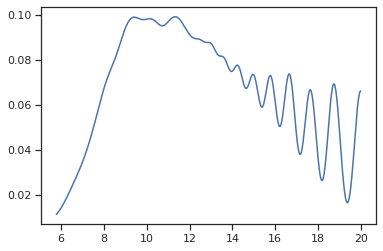

In [138]:
t1 = data['L1C_rot_freq']
kernel_t1 = stats.gaussian_kde(t1)    
t1 = np.linspace(np.percentile(t1, 2), np.percentile(t1, 99), 1000)
height_t1 = kernel_t1.pdf(t1)                                                     
plt.plot(t1, height_t1)